# Olivetti_faces Clustering using k-means

Importing necessary libraries

In [1]:
from sklearn.datasets import fetch_olivetti_faces
import numpy as np
from sklearn.cluster import KMeans
import os
os.environ["OMP_NUM_THREADS"] = "2"

Loading the Olivetti Faces Dataset

In [2]:
faces_data = fetch_olivetti_faces(shuffle=True, random_state=42)
X_faces = faces_data.images.reshape((len(faces_data.images), -1))
y_faces = faces_data.target
num_samples = X_faces.shape[0]
print(f'Total number of face images: {num_samples}')

Total number of face images: 400


Visualizing the data

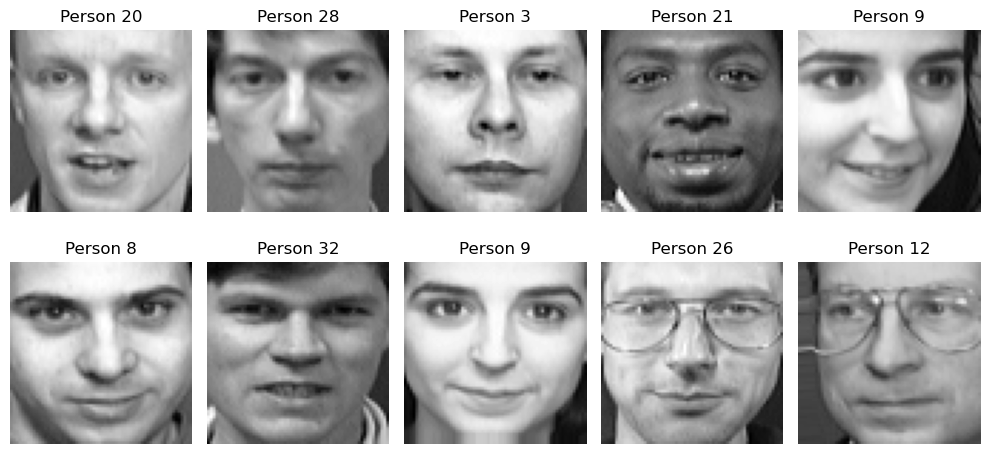

In [3]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
for i in range(10):  # Visualizing 10 faces
    plt.subplot(2, 5, i+1)
    plt.imshow(X_faces[i].reshape(64, 64), cmap='gray')
    plt.title(f"Person {y_faces[i]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

defining the value of k 

In [4]:
num_clusters = 80


Training the model 

In [5]:
# Apply K-means clustering
kmeans_faces = KMeans(n_clusters=num_clusters, random_state=42)
kmeans_faces.fit(X_faces)


D:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


KMeans(n_clusters=80, random_state=42)

In [6]:
# Get cluster assignments for each face
face_cluster_assignments = kmeans_faces.labels_


Visualizing the clusters

In [7]:

# Since the data is high-dimensional, so applying  dimensionality reduction technique
# like PCA 

from sklearn.decomposition import PCA


pca_faces = PCA(n_components=2)
X_pca_faces = pca_faces.fit_transform(X_faces)



In [8]:
# Create a dictionary to store images belonging to each cluster
cluster_images = {}

# Iterate through each cluster and collect the corresponding images
for cluster_label in range(num_clusters):
    cluster_images[cluster_label] = []

for i, cluster_label in enumerate(face_cluster_assignments):
    cluster_images[cluster_label].append(X_faces[i].reshape(64, 64))

# Calculate the number of images in the largest cluster
max_images = max(len(images) for images in cluster_images.values())

# Visualize clusters and images
plt.figure(figsize=(20, 4*num_clusters))

for i, (cluster_label, images) in enumerate(cluster_images.items()):
    for j, image in enumerate(images):
        plt.subplot(num_clusters, max_images, i*max_images+j+1)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
        if j == 0:
            plt.title(f'Cluster {cluster_label + 1}')

plt.subplots_adjust(wspace=0.1, hspace=0.5)  # Adjust the space between subplots

plt.tight_layout()
plt.show()